# Pulsar Star Classification: Integrated Profiles vs. DM-SNR Curves

### Introduction
A pulsar is a rotating neutron star that generates electromagnetic radiation beams and is only visible when its emission is directed towards Earth, creating a "pulsed" look ("Pulsars astronomy," 2022) Due to their highly regular signals, pulsars are something that is of large interest. Once a pulsar has been observed, variations from its typical signals can be used as proof of many cosmic phenomena (Xiao et al., 2019). The radio frequencies emitted by both pulsars and interfering objects can be graphed as integrated profiles and DM-SNR curves with features such as the mean, standard deviation, excess kurtosis and skewness. Radio frequency interference (RFI) and noise make up most detections, making real signals challenging to locate (Xiao et al., 2019). The HTRU2 data set created by Lyon et al. (2016) contains 17,898 data points. Our project question is: Which combination of variables collected would make the most accurate knn classification model and for what k value?

### Methods & Results

The goal of this project was to create the most accurate knn classification model for pulsar star signals. To do this, we created a model that assigned a class to an observation based on the classes of a k number of nearest neighbors. This was performed by tidying the data, summarizing the data, performing a forward selection loop to determine which predictors to use, using the results to determine the best k value, and creating a classification model based on the information obtained. Before performing all this analysis, we set a seed of 300 to ensure that our work would be reproducible.

In [1]:
library(tidyverse)
library(repr)
library(readr)
library(tidymodels)
library(cowplot)
library(themis)
library(GGally)
options(repr.matrix.max.rows = 6)
set.seed(300)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

Warning message:
“package ‘ggplot2’ was built under R version 4.1.3”
Warning message:
“package ‘tidyr’ was built under R version 4.1.2”
Warning message:
“package ‘readr’ was built under R version 4.1.2”
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Warning message:
“package ‘tidymodels’ was built under R version 4.1.3”
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.0     ✔ rsample      1.0.0
✔ dials        1.0.0     ✔ tune         1.0.0
✔ infer        1.0.2     ✔ workflows    1.0.0
✔ modeldata    1.0.0     ✔ workflowsets 1.0.0
✔ parsnip      1.0.0     ✔ yardstick    1.0.0
✔ recipes      1.0.5     



Using the HTRU2 data from the UCI Machine Learning Repository compiled by Lyon et al. (2016), we first tidied the data by assigning column names to each column and converting the data in the class column into a categorical variable to allow for categorization using the as_factor() function. We split the data into 75% training and 25% testing data, with the training data used to train the model and the testing data used to verify the accuracy of the model. 

The following data frame contains the following columns:
1. mean - Mean of the integrated profile.
2. std_dev - Standard deviation of the integrated profile.
3. excess_kurtosis - Excess kurtosis of the integrated profile.
4. skewness - Skewness of the integrated profile.
5. curve_mean - Mean of the DM-SNR curve.
6. curve_std_dev - Standard deviation of the DM-SNR curve.
7. curve_excess_kurtosis - Excess kurtosis of the DM-SNR curve.
8. curve_skewness - Skewness of the DM-SNR curve.
9. class - The class label of the observation.

The class labels used are 0 (negative - is not a pulsar) and 1 (positive - is a pulsar).

In [2]:
url <- "https://archive.ics.uci.edu/ml/machine-learning-databases/00372/HTRU2.zip"
download.file(url, "HTRU_2.zip")
unzip("HTRU_2.zip")
pulsar_data <- read_csv("HTRU_2.csv", col_names = c("mean", "std_dev", "excess_kurtosis", "skewness",
 "curve_mean","curve_std_dev","curve_excess_kurtosis","curve_skewness","class"))|>
               mutate(class = as_factor(class)) 

pulsar_split <- initial_split(pulsar_data, prop = 0.75, strata = class)  
pulsar_train <- training(pulsar_split)   
pulsar_test <- testing(pulsar_split)

pulsar_train
pulsar_train_mean <- pulsar_train |>
               select(mean:curve_excess_kurtosis)|>
               map_df(mean)
pulsar_train_mean
pulsar_count <- pulsar_train |>
    select(class) |>
    group_by(class) |>
    summarize(count = n())
pulsar_count
pulsar_data_na <- sum(is.na(pulsar_data))
print(paste0 ("The number of NA values is:" , pulsar_data_na))

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): mean, std_dev, excess_kurtosis, skewness, curve_mean, curve_std_dev...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


mean,std_dev,excess_kurtosis,skewness,curve_mean,curve_std_dev,curve_excess_kurtosis,curve_skewness,class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.5625,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,0
102.5078,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,0
103.0156,39.34165,0.3233284,1.0511644,3.121237,21.74467,7.735822,63.17191,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,0
114.5078,53.90240,0.2011614,-0.02478884,1.946488,13.38173,10.007967,134.238910,0
57.0625,85.79734,1.4063910,0.08951971,188.306020,64.71256,-1.597527,1.429475,0


mean,std_dev,excess_kurtosis,skewness,curve_mean,curve_std_dev,curve_excess_kurtosis
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
111.0561,46.56023,0.4819723,1.796572,12.66196,26.3654,8.317002


class,count
<fct>,<int>
0,12183
1,1240


[1] "The number of NA values is:0"


**Table 1 (top):** A table depicting the tidied pulsar training data.

**Table 2 (middle):** A table depicting the means of pulsar training data variables.

**Table 3 (bottom):** A table depicting the number of negative and positive signals in the training data.

We performed cleaning and wrangling using the training data to obtain a summary. We obtained the means of each variable, the number of negative and positive signals, and the number of missing data values. Table 3 of this summary showed the large difference in the number of positive and negative signals, indicating unbalanced data. This was important to note for classification model creation, as we needed to balance the data to ensure that the model was accurate and unbiased. It should also be noted that no missing values were identified from the training dataset.

We could not determine which variables would result in the best classification model based on this summary. As a result, we decided to perform a forward selection loop, which created several classification models based on the number of available predictors and returned the accuracy of each one. We did this by setting up a list of the predictors, a table to store the accuracies, a model specification, a 5-fold cross validation object, an object to store the total number of predictors, and an object to store the selected number of predictors. The model specification we used was a knn classification model that would tune for the number of neighbors that yielded the highest accuracy. The purpose of the 5-fold cross validation object was to split the training data into five different combinations of training and validation sets in order to verify the accuracy of the model without exposing it to the testing data. In preparation for use in the for loop, we scaled and centered, as well as balanced the training data using the step_upsample() function from the themis library. The purpose of doing this was to ensure that the distance when determining a nearest neighbor was standardized for all predictors by scaling and centering the data, as well as ensure that the model will not be more likely to assign one category over the other by balancing the data.

After setting up these objects, we created a for loop that would run for the total number of predictors. In this for loop, a new predictor was added to the initially empty stored list of predictors. The updated list of predictors was converted into a string and used in a recipe for creating a knn classification model involving the model specification and cross validation object we created earlier. In this classification model, the k value with the best accuracy was chosen among 10 random k values by the workflow, and the metrics for that accuracy were collected and stored in the accuracy table. This process repeated for every available predictor, leading to a total of 8 classification models where the accuracy was assessed. This forward selection loop returned the accuracy table (Table 4), which allowed us to pick variables that increased model accuracy. We graphed the estimated accuracy against the number of predictors in Figure 1, demonstrating that the first five predictors increased the accuracy, while the final three predictors decreased the accuracy. Referring to Tables 4 and 5, we can observe that the two predictors that decreased the accuracy were the integrated profile mean and the DM-SNR curve mean and standard deviation. Thus, we used all predictors excluding these three in creating our classification model.

In [3]:
pulsar_data_recipe <- recipe(class ~ ., data = pulsar_train) |>
                        step_scale(all_predictors()) |>
                        step_center(all_predictors()) |>
                        step_upsample(class, over_ratio = 1, skip = FALSE)

pulsar_data_scaled <- pulsar_data_recipe |>  
                            prep() |> 
                            bake(pulsar_train)

In [26]:
names <- colnames(pulsar_train |> select(-class))
accuracies <- tibble(size = integer(), 
                     model_string = character(), 
                     accuracy = numeric())

# create a model specification
knn_spec <- nearest_neighbor(weight_func = "rectangular", 
                             neighbors = tune()) |>
     set_engine("kknn") |>
     set_mode("classification")

# create a 5-fold cross-validation object
pulsar_vfold <- vfold_cv(pulsar_data_scaled, v = 5, strata = class)

# store the total number of predictors
n_total <- length(names)

# stores selected predictors
selected <- c()



In [27]:
# for every size from 1 to the total number of predictors
for (i in 1:n_total) {
    # for every predictor still not added yet
    accs <- list()
    models <- list()
    for (j in 1:length(names)) {
        # create a model string for this combination of predictors
        preds_new <- c(selected, names[[j]])
        model_string <- paste("class", "~", paste(preds_new, collapse="+"))

        # create a recipe from the model string
        pulsar_recipe <- recipe(as.formula(model_string), 
                                data = pulsar_data_scaled)

        # tune the KNN classifier with these predictors, 
        # and collect the accuracy for the best K
        acc <- workflow() |>
          add_recipe(pulsar_recipe) |>
          add_model(knn_spec) |>
          tune_grid(resamples = pulsar_vfold, grid = 10) |>
          collect_metrics() |>
          filter(.metric == "accuracy") |>
          summarize(mx = max(mean))
        acc <- acc$mx |> unlist()

        # add this result to the dataframe
        accs[[j]] <- acc
        models[[j]] <- model_string
    }
    jstar <- which.max(unlist(accs))
    accuracies <- accuracies |> 
      add_row(size = i, 
              model_string = models[[jstar]], 
              accuracy = accs[[jstar]])
    selected <- c(selected, names[[jstar]])
    names <- names[-jstar]
}
accuracies

size,model_string,accuracy
<int>,<chr>,<dbl>
1,class ~ excess_kurtosis,0.9879341
2,class ~ excess_kurtosis+curve_excess_kurtosis,0.9903144
3,class ~ excess_kurtosis+curve_excess_kurtosis+std_dev,0.9908480
⋮,⋮,⋮
6,class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness+curve_skewness+curve_mean,0.9912584
7,class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness+curve_skewness+curve_mean+curve_std_dev,0.9910942
8,class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness+curve_skewness+curve_mean+curve_std_dev+mean,0.9909711


**Table 4:**  A table depicting the relative accuracies changing with added variables.

# A tibble: 8 × 3
   size model_string                                                    accuracy
  <int> <chr>                                                              <dbl>
1     1 class ~ excess_kurtosis                                            0.988
2     2 class ~ excess_kurtosis+curve_excess_kurtosis                      0.990
3     3 class ~ excess_kurtosis+curve_excess_kurtosis+std_dev              0.991
4     4 class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness     0.991
5     5 class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness…    0.991
6     6 class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness…    0.991
7     7 class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness…    0.991
8     8 class ~ excess_kurtosis+curve_excess_kurtosis+std_dev+skewness…    0.991


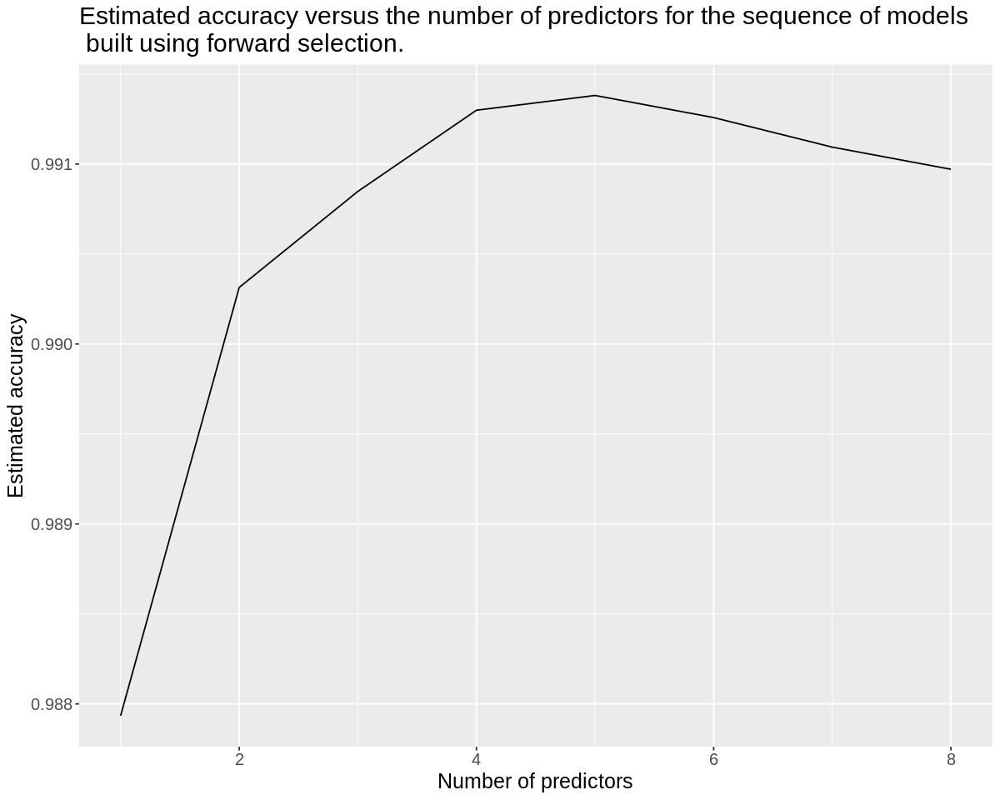

In [28]:
print(accuracies, n = 8)
options(repr.plot.width=10,repr.plot.height=8)
accuracy_plot <- accuracies |>
  ggplot(aes(x = size, y = accuracy)) +
  geom_line() +
  labs(x = "Number of predictors",y = "Estimated accuracy") +
  theme(text = element_text(size = 15)) +
  ggtitle("Estimated accuracy versus the number of predictors for the sequence of models \n built using forward selection.")
accuracy_plot

**Table 5 (top):** A table depicting all accuracy values for all 8 classification models.

**Figure 1 (bottom):** A graph plotting the estimated accuracy of each classification model against the number of predictors involved in the model.

In order to graphically represent the variables chosen for the model, we utilized the GGally library's ggpairs() function to create Figure 2, as it was difficult to create individual graphs to depict the relationships between each of the five selected predictors.


In [5]:
pulsar_train_new <- pulsar_data_scaled|>
                    select(-curve_mean,-mean,-curve_std_dev)

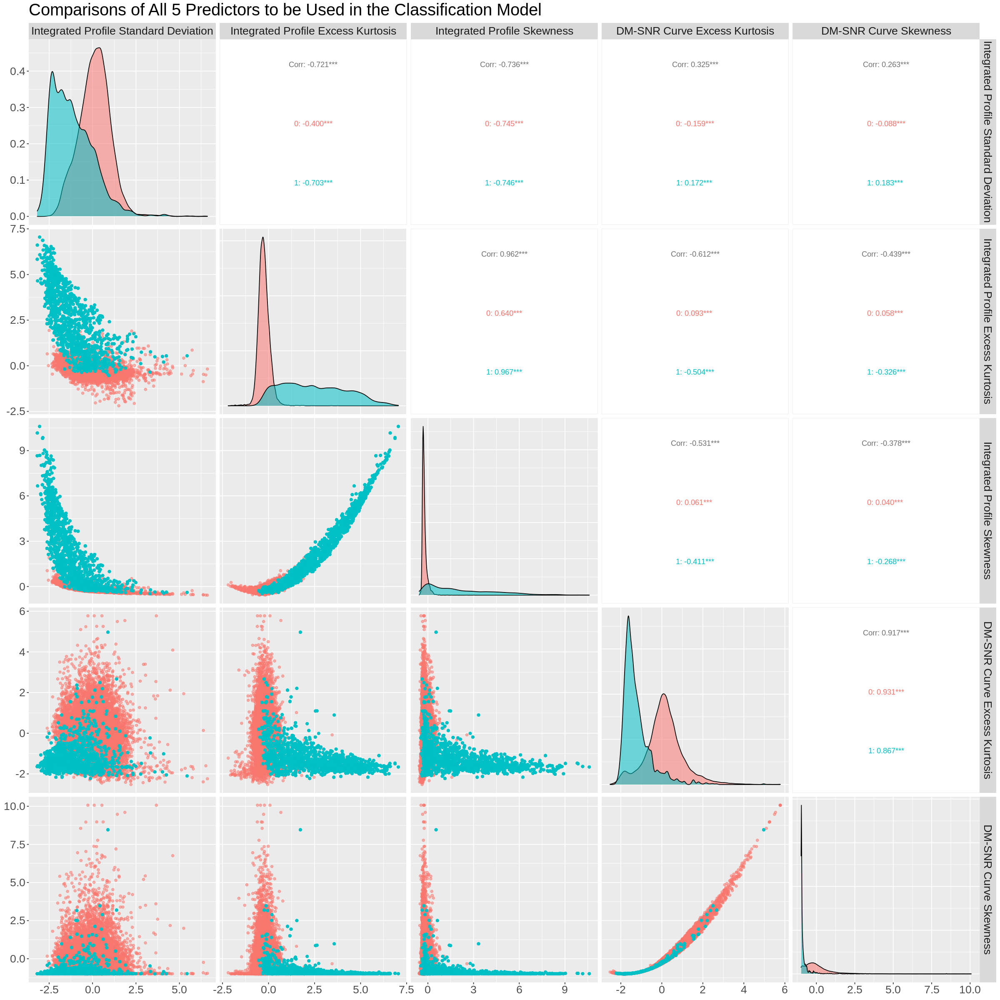

In [6]:
options(repr.plot.width=20,repr.plot.height=20)
data_plot <- ggpairs(pulsar_train_new,
                     columns = 1:5,
                     columnLabels = c("Integrated Profile Standard Deviation", "Integrated Profile Excess Kurtosis", "Integrated Profile Skewness", 
                                      "DM-SNR Curve Excess Kurtosis", "DM-SNR Curve Skewness"),
                     aes(color = class, alpha = 0.03)) +
            theme(text = element_text(size = 20)) +
            ggtitle("Comparisons of All 5 Predictors to be Used in the Classification Model")
data_plot

**Figure 2:** An array of graphs demonstrating scatter plot comparisons of each of the 5 predictors to be used in the classification models, the density distribution of each class for each predictor, and the correlation coefficient for all plots. In these plots, red represents non-pulsar signals (0) and blue represents pulsar signals (1).

While we had the predictors we wanted to use, we still needed to choose the optimal k value to create the classification model, which is a crucial step for obtaining the most accurate model. We did this by creating an unbalanced data frame involving our five desired predictors and the class of each observation, a tuning model specification, a table of k values, a recipe involving the aforementioned data frame, and a 5-fold cross validation object. The data had to be unbalanced to choose a k value as balanced data would cause smaller k values to be more accurate due to duplication of existing points in the step_upsample() function. A workflow was used to combine the recipe with the model specification and the cross validation object, which perform the same functions as their counterparts in the previously mentioned forward selection loop. However, the k values tested this time are specified by the table of k values, rather than randomly chosen by the workflow. We first tested these k values from 1 to 100 in increments of 10 as we expected a larger k value due to the size of the data set. Based on Figure 3, we narrowed it down to 60 k values. This was determined by collecting the metrics of the workflow and plotting the number of neighbors against the estimated accuracy, which allowed us to select the best k value for this set of data and the model is created. This k value ended up being 10, as we can observe that the accuracy is greatest for 5, 6, 9 and 10 neighbors from Figure 4. As the estimated accuracy is the same, we chose the highest number of neighbors as more neighbors will minimize any fluctuations in actual accuracy especially since only using fewer neighbors can heavily influence the outcome of the classification. This step is crucial in estimating how effective the model will be on new data that has not yet been examined or seen, thus allowing for a k value which avoids under or overfitting.

In [7]:
set.seed(300)
pulsar_train_unbalanced <- pulsar_train|>
                    select(-curve_mean,-mean,-curve_std_dev)

knn_tune <- nearest_neighbor(weight_func = "rectangular", 
                             neighbors = tune()) |>
  set_engine("kknn") |>
  set_mode("classification")

kvals <- tibble(neighbors = seq(1, 100, 10))

pulsar_test_recipe <- recipe(class ~ ., data = pulsar_train_unbalanced) |>
                        step_scale(all_predictors()) |>
                        step_center(all_predictors()) 
pulsar_vfold <- vfold_cv(pulsar_train_unbalanced, v = 5, strata = class)

pulsar_resample_fit<- workflow() |>
       add_recipe(pulsar_test_recipe) |>
       add_model(knn_tune) |>
       tune_grid(resamples = pulsar_vfold, grid = kvals)|>
       collect_metrics() 
accuracies <- pulsar_resample_fit |> 
       filter(.metric == "accuracy")

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9713175,5,0.001528661,Preprocessor1_Model01
11,accuracy,binary,0.9782460,5,0.001147428,Preprocessor1_Model02
21,accuracy,binary,0.9780970,5,0.001193711,Preprocessor1_Model03
⋮,⋮,⋮,⋮,⋮,⋮,⋮
71,accuracy,binary,0.977799,5,0.001135243,Preprocessor1_Model08
81,accuracy,binary,0.977799,5,0.001019155,Preprocessor1_Model09
91,accuracy,binary,0.977352,5,0.001064538,Preprocessor1_Model10


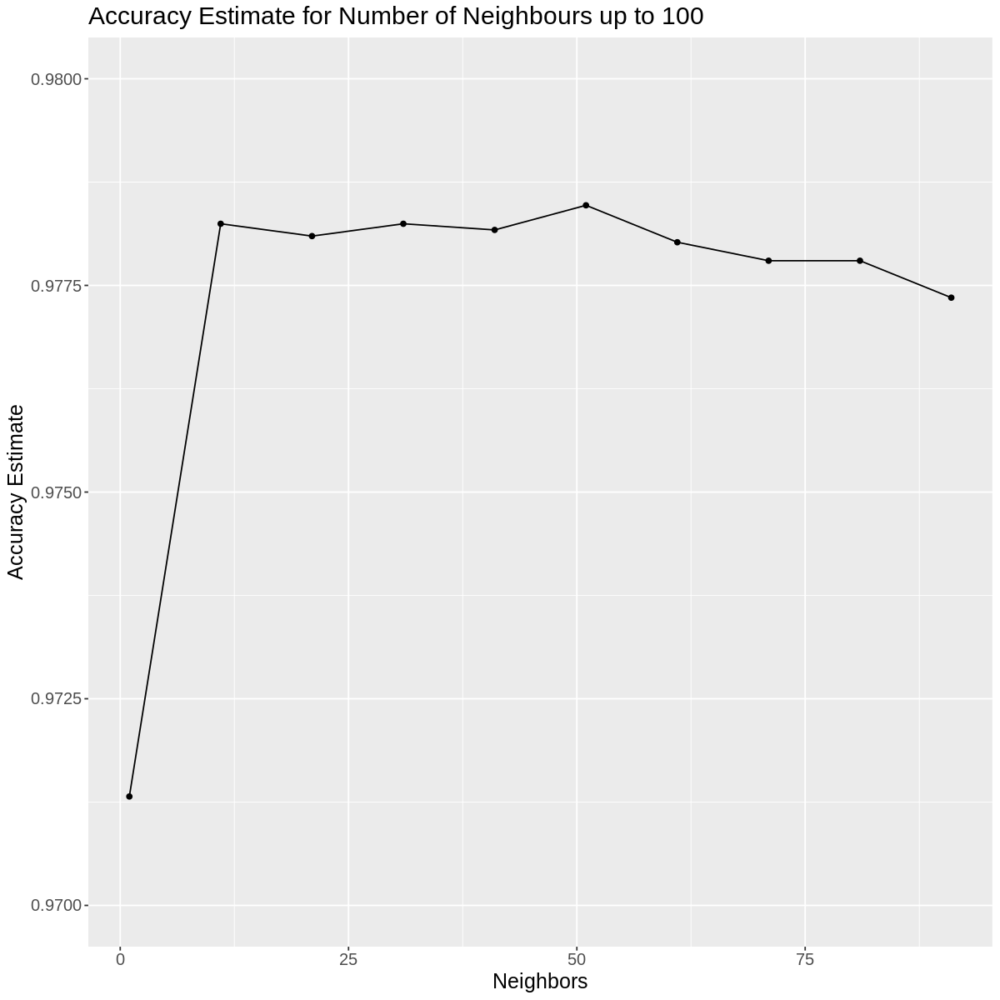

In [8]:
options(repr.plot.width=10,repr.plot.height=10)
accuracies <- pulsar_resample_fit |> 
       filter(.metric == "accuracy")
accuracies
accuracy_versus_k <- ggplot(accuracies, aes(x = neighbors, y = mean))+
       geom_point() +
       geom_line() +
       labs(x = "Neighbors", y = "Accuracy Estimate") +
       scale_y_continuous(limits = c(0.97, 0.98)) + # adjusting the y-axis 
       ggtitle("Accuracy Estimate for Number of Neighbours up to 100") +
       theme(text = element_text(size = 15))

accuracy_versus_k

**Table 6 (top):** A table depicting the metrics of the tuning workflow, including the corresponding estimated accuracy for each number of neighbours (k). This table is for ten k values from 1 to 100.

**Figure 3 (bottom):** A graph plotting the estimated accuracy against each number of neighbours for 10 values from 1 to 100.

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9713175,5,0.0015286614,Preprocessor1_Model01
2,accuracy,binary,0.9713175,5,0.0015286614,Preprocessor1_Model02
3,accuracy,binary,0.9783207,5,0.0003221445,Preprocessor1_Model03
⋮,⋮,⋮,⋮,⋮,⋮,⋮
58,accuracy,binary,0.978097,5,0.001250462,Preprocessor1_Model58
59,accuracy,binary,0.978097,5,0.001250462,Preprocessor1_Model59
60,accuracy,binary,0.978097,5,0.001250462,Preprocessor1_Model60


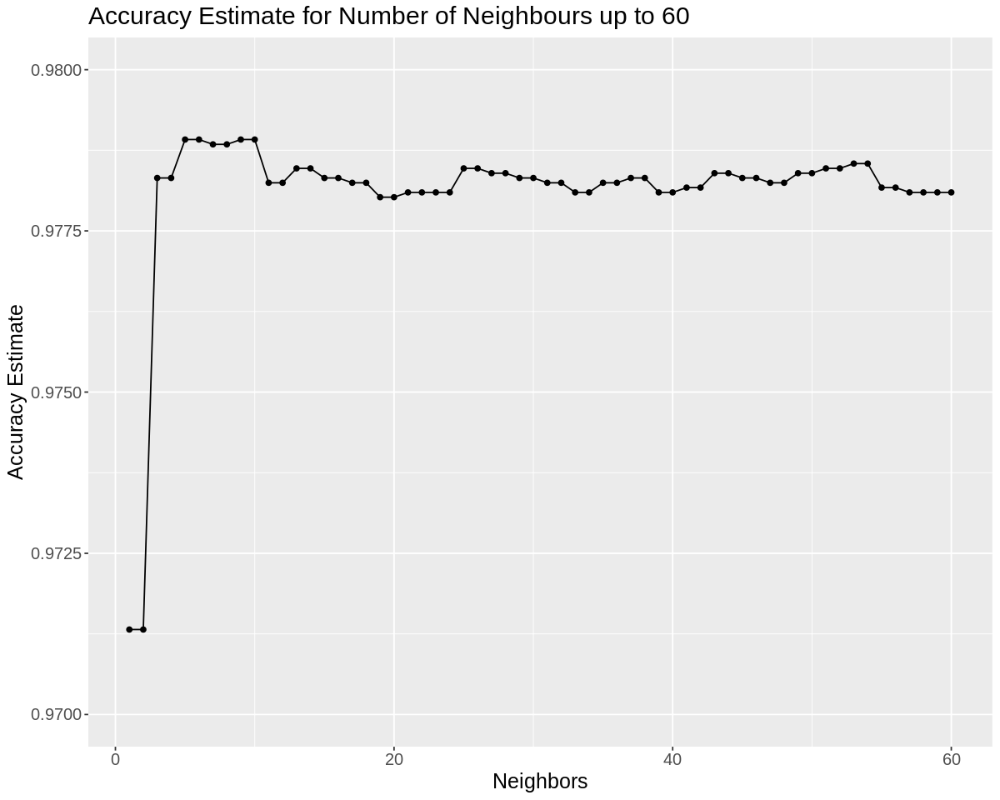

In [9]:
set.seed(300)
options(repr.plot.width=10,repr.plot.height=8)
kvals_2 <- tibble(neighbors = seq(1, 60, 1))

pulsar_resample_fit_2<- workflow() |>
       add_recipe(pulsar_test_recipe) |>
       add_model(knn_tune) |>
       tune_grid(resamples = pulsar_vfold, grid = kvals_2)|>
       collect_metrics() 
accuracies_2 <- pulsar_resample_fit_2 |> 
       filter(.metric == "accuracy")
accuracies_2
accuracy_versus_k_2 <- ggplot(accuracies_2, aes(x = neighbors, y = mean))+
       geom_point() +
       geom_line() +
       labs(x = "Neighbors", y = "Accuracy Estimate") +
       scale_y_continuous(limits = c(0.97, 0.98)) + # adjusting the y-axis 
       ggtitle("Accuracy Estimate for Number of Neighbours up to 60") +
       theme(text = element_text(size = 15))

accuracy_versus_k_2

**Table 7 (top):** A table depicting the metrics of the tuning workflow, including the corresponding estimated accuracy for each number of neighbours (k). This table is for sixty k values from 1 to 60.

**Figure 4 (bottom):** A graph plotting the estimated accuracy against each number of neighbours for 60 values from 1 to 60.

In [11]:
highest_accuracy <- accuracies_2 |>
    slice(10)
highest_accuracy

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
10,accuracy,binary,0.9789166,5,0.0007334813,Preprocessor1_Model10


**Table 8:** A table depicting the metrics of row 10 of the tuning workflow.

Given the selected predictors and k value, we created a classification model. This involved creating a recipe using the balanced training data and creating a new knn model specification that specifies the number of neighbors as 10. The recipe and model specification were inputted into a workflow and fitted to the initial data frame that was previously created to determine the k value. With the classification model created, we obtained the actual accuracy using the testing data we initially set aside. By using the classification model to predict the classes of the observations in the testing data and obtaining the percentage of correct predictions, we were able to determine the accuracy of our model, which was 91.11%.

In [13]:
pulsar_recipe_new <- recipe(class ~ ., data = pulsar_train_new) 
knn_spec_2 <- nearest_neighbor(weight_func = "rectangular", neighbors = 10) |>
  set_engine("kknn") |>
  set_mode("classification")
pulsar_fit <- workflow() |>
  add_recipe(pulsar_recipe_new) |>
  add_model(knn_spec_2) |>
  fit(data =pulsar_train_new)
pulsar_test_predictions <- predict(pulsar_fit, pulsar_test) |>
  bind_cols(pulsar_test)
pulsar_test_predictions |>
  metrics(truth = class, estimate = .pred_class) |>
  filter(.metric == "accuracy")
pulsar_test_predictions
confusion <- pulsar_test_predictions |>
             conf_mat(truth = class, estimate = .pred_class)
confusion

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9110615


.pred_class,mean,std_dev,excess_kurtosis,skewness,curve_mean,curve_std_dev,curve_excess_kurtosis,curve_skewness,class
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
0,136.7500,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,0
0,142.0781,45.28807,-0.32032843,0.2839525,5.376254,29.00990,6.076266,37.83139,0
0,134.9609,49.55433,-0.13530383,-0.0804696,10.696488,41.34204,3.893934,14.13121,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0,84.42188,41.77556,0.757467101,1.1070748,1.3361204,12.026757,14.50286,258.1198,0
0,133.82031,43.47816,0.136691092,0.3531212,0.9824415,9.486068,18.52839,444.4117,0
0,127.07031,47.66356,0.006552426,-0.1236337,0.8536789,11.197206,16.12270,296.5077,0


          Truth
Prediction    0    1
         0 4076  398
         1    0    1

**Table 8 (top):** A table depicting the estimated accuracy of the classification model for the training data as a decimal.

**Table 9 (middle):** A table depicting each observation, its predicted class and its actual class.

**Table 10 (bottom):** A confusion matrix demonstrating the number of accurate and inaccurate predictions.

In order to visualize this classification model, we created five objects that would represent 100 points from the minimum value to the maximum value of each predictor, and five objects that would act as a placeholder values for each predictor. We then combined these in 10 different combinations to create 10 different data frames that would only compare two predictors to each other and used the classification model to predict every single point in the data frame, effectively creating a grid representation of the classification model for two predictors only. These were then plotted on the same graphs as the training data, and put together in an array in Figure 5.

In [14]:
grid_1 <- seq(min(pulsar_train_new$std_dev), 
                max(pulsar_train_new$std_dev), 
                length.out = 100)
grid_2 <- seq(min(pulsar_train_new$excess_kurtosis), 
                max(pulsar_train_new$excess_kurtosis), 
                length.out = 100)
grid_3 <- seq(min(pulsar_train_new$skewness), 
                max(pulsar_train_new$skewness), 
                length.out = 100)
grid_4 <- seq(min(pulsar_train_new$curve_excess_kurtosis), 
                max(pulsar_train_new$curve_excess_kurtosis), 
                length.out = 100)
grid_5 <- seq(min(pulsar_train_new$curve_skewness), 
                max(pulsar_train_new$curve_skewness), 
                length.out = 100)
grid_1_1 <- seq(min(pulsar_train_new$std_dev), 
                max(pulsar_train_new$std_dev), 
                length.out = 1)
grid_2_1 <- seq(min(pulsar_train_new$excess_kurtosis), 
                max(pulsar_train_new$excess_kurtosis), 
                length.out = 1)
grid_3_1 <- seq(min(pulsar_train_new$skewness), 
                max(pulsar_train_new$skewness), 
                length.out = 1)
grid_4_1 <- seq(min(pulsar_train_new$curve_excess_kurtosis), 
                max(pulsar_train_new$curve_excess_kurtosis), 
                length.out = 1)
grid_5_1 <- seq(min(pulsar_train_new$curve_skewness), 
                max(pulsar_train_new$curve_skewness), 
                length.out = 1)

In [15]:
asgrid_1 <- as_tibble(expand.grid(std_dev = grid_1, 
                               excess_kurtosis = grid_2,
                               skewness = grid_3_1,
                                curve_excess_kurtosis = grid_4_1,
                               curve_skewness = grid_5_1
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_1 <- predict(pulsar_fit, asgrid_1)

# bind the predictions as a new column with the grid points
prediction_table_1 <- bind_cols(knnPredGrid_1, asgrid_1) |> 
  rename(class = .pred_class)

wkflw_plot1 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = excess_kurtosis, 

                           y = std_dev, 
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_1, 
             mapping = aes(x = excess_kurtosis, 
                           y = std_dev, 
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Excess kurtosis of the integrated profile (standardized)", 
       y = "Standard deviation of the integrated profile (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Profile Standard Deviation vs. Profile \n Excess Kurtosis")

In [16]:
asgrid_2 <- as_tibble(expand.grid(std_dev = grid_1_1, 
                               excess_kurtosis = grid_2,
                               skewness = grid_3,
                                curve_excess_kurtosis = grid_4_1,
                               curve_skewness = grid_5_1
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_2 <- predict(pulsar_fit, asgrid_2)

# bind the predictions as a new column with the grid points
prediction_table_2 <- bind_cols(knnPredGrid_2, asgrid_2) |> 
  rename(class = .pred_class)

wkflw_plot2 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = excess_kurtosis,
                           y = skewness,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_2, 
             mapping = aes(x = excess_kurtosis,
                           y = skewness,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Excess kurtosis of the integrated profile (standardized)", 
       y = "Skewness of the integrated profile (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Profile Skewness vs. Profile \n Excess Kurtosis")

In [17]:
asgrid_3 <- as_tibble(expand.grid(std_dev = grid_1_1, 
                               excess_kurtosis = grid_2,
                               skewness = grid_3_1,
                                curve_excess_kurtosis = grid_4,
                               curve_skewness = grid_5_1
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_3 <- predict(pulsar_fit, asgrid_3)

# bind the predictions as a new column with the grid points
prediction_table_3 <- bind_cols(knnPredGrid_3, asgrid_3) |> 
  rename(class = .pred_class)

wkflw_plot3 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = excess_kurtosis,
                           y = curve_excess_kurtosis,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_3, 
             mapping = aes(x = excess_kurtosis,
                           y = curve_excess_kurtosis,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Excess kurtosis of the integrated profile (standardized)", 
       y = "Excess kurtosis of the DM-SNR curve (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Curve Excess kurtosis vs. Profile \n Excess Kurtosis")

In [18]:
asgrid_4 <- as_tibble(expand.grid(std_dev = grid_1_1, 
                               excess_kurtosis = grid_2,
                               skewness = grid_3_1,
                                curve_excess_kurtosis = grid_4_1,
                               curve_skewness = grid_5
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_4 <- predict(pulsar_fit, asgrid_4)

# bind the predictions as a new column with the grid points
prediction_table_4 <- bind_cols(knnPredGrid_4, asgrid_4) |> 
  rename(class = .pred_class)

wkflw_plot4 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = excess_kurtosis,
                           y = curve_skewness,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_4, 
             mapping = aes(x = excess_kurtosis,
                           y = curve_skewness,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Excess kurtosis of the integrated profile (standardized)", 
       y = "Skewness of the DM-SNR curve (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Curve Skewness vs. Profile Excess Kurtosis")

In [19]:
asgrid_5 <- as_tibble(expand.grid(std_dev = grid_1, 
                               excess_kurtosis = grid_2_1,
                               skewness = grid_3,
                                curve_excess_kurtosis = grid_4_1,
                               curve_skewness = grid_5_1
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_5 <- predict(pulsar_fit, asgrid_5)

# bind the predictions as a new column with the grid points
prediction_table_5 <- bind_cols(knnPredGrid_5, asgrid_5) |> 
  rename(class = .pred_class)

wkflw_plot5 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = std_dev,
                           y = skewness,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_5, 
             mapping = aes(x = std_dev,
                           y = skewness,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Standard deviation of the integrated profile (standardized)", 
       y = "Skewness of the integrated profile (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Profile Skewness vs. Profile \n Standard Deviation")

In [20]:
asgrid_6 <- as_tibble(expand.grid(std_dev = grid_1, 
                               excess_kurtosis = grid_2_1,
                               skewness = grid_3_1,
                                curve_excess_kurtosis = grid_4,
                               curve_skewness = grid_5_1
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_6 <- predict(pulsar_fit, asgrid_6)

# bind the predictions as a new column with the grid points
prediction_table_6 <- bind_cols(knnPredGrid_6, asgrid_6) |> 
  rename(class = .pred_class)

wkflw_plot6 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = std_dev,
                           y = curve_excess_kurtosis,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_6, 
             mapping = aes(x = std_dev,
                           y = curve_excess_kurtosis,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Standard deviation of the integrated profile (standardized)", 
       y = "Excess kurtosis of the DM-SNR curve (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
 theme(text = element_text(size = 15))+
ggtitle("Classification of Curve Excess Kurtosis vs. Profile \n Standard Deviation")

In [21]:
asgrid_7 <- as_tibble(expand.grid(std_dev = grid_1, 
                               excess_kurtosis = grid_2_1,
                               skewness = grid_3_1,
                                curve_excess_kurtosis = grid_4_1,
                               curve_skewness = grid_5
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_7 <- predict(pulsar_fit, asgrid_7)

# bind the predictions as a new column with the grid points
prediction_table_7 <- bind_cols(knnPredGrid_7, asgrid_7) |> 
  rename(class = .pred_class)
wkflw_plot7 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = curve_skewness,
                           y = std_dev,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_7, 
             mapping = aes(x = curve_skewness,
                           y = std_dev,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Skewness of the DM-SNR curve(standardized)", 
       y = "Standard deviation of integrated profile (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Profile Standard Deviation vs. \n Curve Skewness")

In [22]:
asgrid_8 <- as_tibble(expand.grid(std_dev = grid_1_1, 
                               excess_kurtosis = grid_2_1,
                               skewness = grid_3,
                                curve_excess_kurtosis = grid_4,
                               curve_skewness = grid_5_1
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_8 <- predict(pulsar_fit, asgrid_8)

# bind the predictions as a new column with the grid points
prediction_table_8 <- bind_cols(knnPredGrid_8, asgrid_8) |> 
  rename(class = .pred_class)
wkflw_plot8 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = skewness,
                           y = curve_excess_kurtosis,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_8, 
             mapping = aes(x = skewness,
                           y = curve_excess_kurtosis,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Skewness of the integrated profile (standardized)", 
       y = "Excess kurtosis of DM-SNR curve (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Curve Excess Kurtosis vs. \n Profile Skewness")

In [23]:
asgrid_9 <- as_tibble(expand.grid(std_dev = grid_1_1, 
                               excess_kurtosis = grid_2_1,
                               skewness = grid_3,
                                curve_excess_kurtosis = grid_4_1,
                               curve_skewness = grid_5
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_9 <- predict(pulsar_fit, asgrid_9)

# bind the predictions as a new column with the grid points
prediction_table_9 <- bind_cols(knnPredGrid_9, asgrid_9) |> 
  rename(class = .pred_class)
wkflw_plot9 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = skewness,
                           y = curve_skewness,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_9, 
             mapping = aes(x = skewness,
                           y = curve_skewness,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Skewness of integrated profile(standardized)", 
       y = "Skewness of DM-SNR curve (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Curve Skewness vs. Profile Skewness")

In [24]:
asgrid_10 <- as_tibble(expand.grid(std_dev = grid_1_1, 
                               excess_kurtosis = grid_2_1,
                               skewness = grid_3_1,
                                curve_excess_kurtosis = grid_4,
                               curve_skewness = grid_5
                               ))
# use the fit workflow to make predictions at the grid points
knnPredGrid_10 <- predict(pulsar_fit, asgrid_10)

# bind the predictions as a new column with the grid points
prediction_table_10 <- bind_cols(knnPredGrid_10, asgrid_10) |> 
  rename(class = .pred_class)
wkflw_plot10 <-
  ggplot() +
  geom_point(data = pulsar_train_new, 
             mapping = aes(x = curve_excess_kurtosis,
                           y = curve_skewness,
                           color = class), 
             alpha = 0.75) +
  geom_point(data = prediction_table_10, 
             mapping = aes(x = curve_excess_kurtosis,
                           y = curve_skewness,
                           color = class), 
             alpha = 0.2, 
             size = 5) +
  labs(color = "class", 
       x = "Excess kurtosis of DM-SNR curve (standardized)", 
       y = "Skewness of DM-SNR curve (standardized)") +
  scale_color_manual(labels = c("Negative", "Positive"), 
                     values = c("orange2", "steelblue2")) +
  theme(text = element_text(size = 15))+
ggtitle("Classification of Curve Excess Kurtosis vs. \n Curve Skewness")

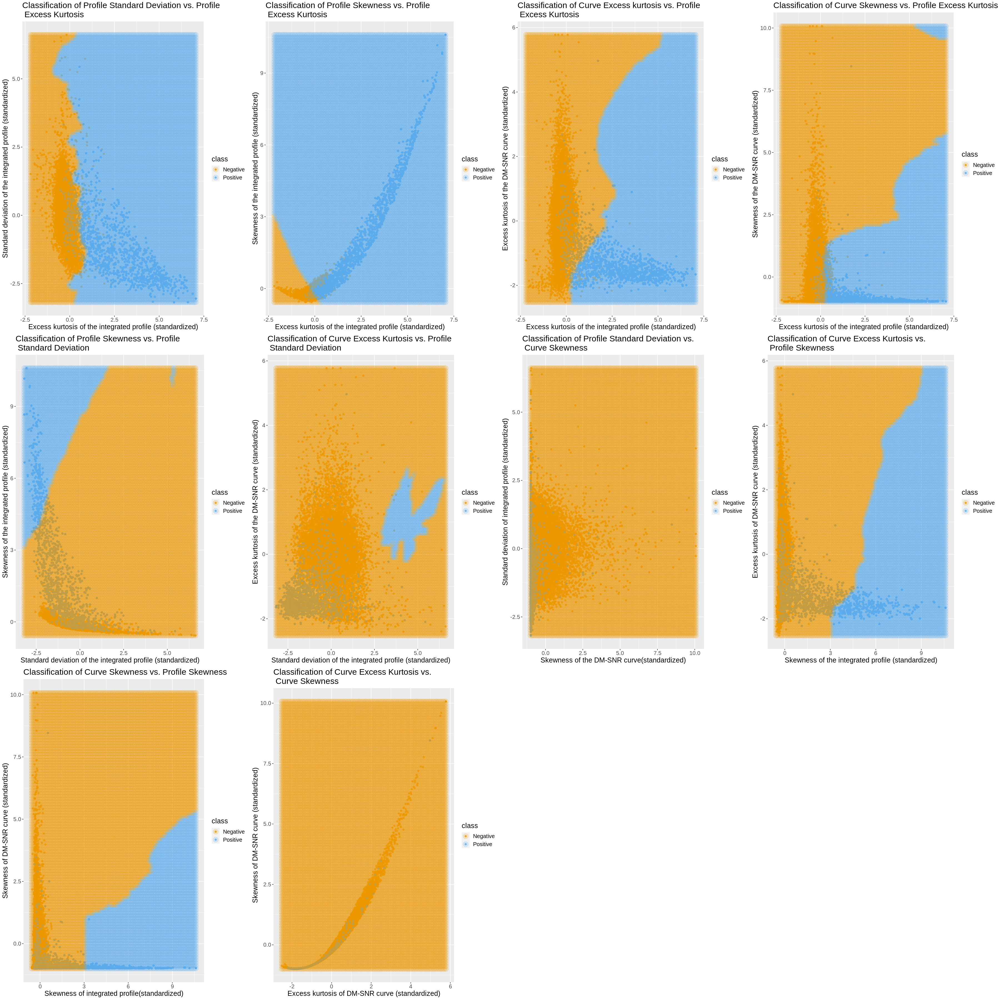

In [25]:
options(repr.plot.width=30,repr.plot.height=30)
plot_grid(wkflw_plot1,wkflw_plot2,wkflw_plot3,wkflw_plot4,
          wkflw_plot5,wkflw_plot6,wkflw_plot7,wkflw_plot8,
          wkflw_plot9,wkflw_plot10,ncol=4)

**Figure 5:** An array of 10 graphs depicting the classification model compared to the balanced training data. Orange represents non-pulsar signals, while blue represents pulsar signals.

### Discussion
Our first discovery was that it was better not to use all the variables for classification. Using the forward selection algorithm (nested for loops), we assessed the accuracy of the classification model with the addition of one variable at a time to check if they increased or decreased accuracy. We found that using all variables except mean, curve mean and curve standard deviation would create the most accurate model. Using the variables that increased the accuracy, we created a classification model that checked all neighbors in increments of 10 from 1 to 100, and looked at each k value from 1-60 because the accuracy was the highest in that region. From this, we found that 10 neighbors had the highest accuracy of 97.89%. Then we tested this on our testing data to get an accuracy of 91.11%.

Finding that 5 variables made the best classifier was unexpected because we thought that all of the variables would be helpful in the classification. It was also surprising that the mean of both curves was excluded from the classification model, as these are significant in defining the profile of radio frequencies. It is also surprising that our k value was only 10, and that we needed to use unbalanced data to get this value. We initially used balanced data to find the best number of neighbours and obtained a k value of 2 with an estimated accuracy of 99%, which resulted in severely overfitted data and a model that only predicted one class for all observations, leading to the realization that the duplication of the data points in the balancing process would make the k value extremely small and cause overfitting. However, some overfitting is still shown in Figure 5, indicating that the k value of 10 may still be too small since the smaller class is duplicated approximately 12 times to balance the data. The estimated accuracy of 97.89% was also unexpectedly high because most times we have seen it hover around the low 90s. The most unexpected finding was that our classifier predicted all negative values but one and still had a 91% accuracy. This was due to the abundance of negative values in the testing data and could be both because the seed gave a higher number of classifiers and a lower number of neighbours because of the random selection, as shown by how some overfitting is seen in Figure 5.

Although this specific classifier is based partially on randomness-predicted negative values, the same method can be used to create classification models that can have significant impacts. They can mean a significant cut down in the data collected about pulsar stars. Collecting data about radio frequencies from space is not an easy task and cutting down on how much data needs to be collected could make a difference. In our case, instead of collecting 8 variables on each radio frequency, we can collect 5 to most accurately classify it as a pulsar star or not. To put into perspective, for our 17,898 entries, 53,694 bits of information need not have been collected if the classification was done using only the 5 variables mentioned. The avoidable data includes some information about both the DM-SNR curve and the integrated profile, which means that some steps of processing data and then graphing it and then finding information about the curve could be avoided, saving the costs, memory, and time doing this. Additionally, this also confirms that we can be reasonably accurate in distinguishing radio frequencies and pulsar stars, because of the high accuracies we got in the results (given a different seed).

Although we found some significant information, some questions still remain:

Will this model do well on other sets of data that were not stored in the database we used?

Why do skewness and curve excess kurtosis make the classification less accurate?

Why was the k value so low?

Why, despite balancing, did the classifier predict all negative values? the results (given a different seed).


### References


   Lyon, R. J., Stappers, B. W., Cooper, S., Brooke, J. M., & Knowles, J. D. (2016). Fifty Years of pulsar candidate selection: From simple filters to a new principled real-time classification approach. Monthly Notices of the Royal Astronomical Society, 459(1), 1104–1123. https://doi.org/10.1093/mnras/stw656 

   Pulsars astronomy. (2022, January 25). National Radio Astronomy Observatory. https://public.nrao.edu/radio-astronomy/pulsars/

   Xiao, J., Li, X., Lin, H., & Qiu, K. (2019). Pulsar candidate selection using pseudo-nearest centroid neighbour classifier. Monthly Notices of the Royal Astronomical Society, 492(2), 2119-2127. https://doi.org/10.1093/mnras/stz3539
